# Batch Processing and Dimensionality Reduction on Gaia DR3
This notebook processes the Gaia DR3 dataset in batches, performs dimensionality reduction (PCA, t-SNE, PaCMAP, TriMap), saves results to disk, and visualizes the aggregated results.

In [1]:
import time
import warnings

import pacmap
import trimap
import umap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from astroquery.gaia import Gaia
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from astropy.coordinates import SkyCoord
import astropy.units as u

### Batch Processing Configuration

In [ ]:
BATCH_SIZE = 20000
MAX_STARS_TO_PROCESS = 2000000

TEST_MODE = False  # Set to False to process the full dataset based on MAX_STARS_TO_PROCESS
MAX_BATCHES_IN_TEST_MODE = 1  # Number of batches to process if TEST_MODE is True

features_for_dr = [
    'parallax', 'parallax_error', 'pmra', 'pmra_error', 'pmdec', 'pmdec_error',
    'radial_velocity', 'ra', 'dec', 'l', 'b'
]

features_to_color_tuples = [
    ('phot_g_mean_mag', 'G-band Magnitude', 'viridis_r'),
    ('l', 'Galactic Longitude (deg)', 'twilight'),
    ('b', 'Galactic Latitude (deg)', 'twilight'),
    ('parallax', 'Parallax (mas)', 'plasma'),
    ('pmra', 'Proper Motion RA (mas/yr)', 'magma'),
    ('pmdec', 'Proper Motion Dec (mas/yr)', 'inferno'),
    ('bp_rp_color', 'BP-RP Color Index', 'cividis'),
    ('radial_velocity', 'Radial Velocity (km/s)', 'plasma'),
    ('ruwe', 'RUWE', 'magma'),
    ('phot_bp_mean_mag', 'BP Magnitude', 'viridis_r'),
    ('phot_rp_mean_mag', 'RP Magnitude', 'plasma'),
    ('parallax_error', 'Parallax Error (mas)', 'magma'),
    ('pmra_error', 'PM RA Error (mas/yr)', 'inferno'),
    ('pmdec_error', 'PM Dec Error (mas/yr)', 'plasma'),
]

plotting_feature_names_to_save = list(set([f[0] for f in features_to_color_tuples] + ['source_id']))
output_hdf_file = '../data/gaia_bright_stars.h5'

scaler = StandardScaler()

all_plotting_data_batches = []
all_scaled_features_batches = []
total_stars_processed = 0

### Batch Data Fetching, Preprocessing

In [ ]:
def fetch_gaia_data(batch_size=50000, last_source_id=None):
    # Query for Galactic Plane and Bulge: |b| < 10°, optionally |l| < 20°
    # We'll compute l, b from ra, dec after fetching
    where_clause = ""
    if last_source_id is not None:
        where_clause += f" AND g.source_id > {last_source_id}"
    query = f'''
    SELECT TOP {batch_size}
    g.source_id, g.ra, g.dec, g.parallax, g.parallax_error, 
    g.pmra, g.pmra_error, g.pmdec, g.pmdec_error,
    g.phot_g_mean_mag, g.phot_bp_mean_mag, g.phot_rp_mean_mag,
    g.radial_velocity, g.radial_velocity_error,
    g.ruwe
    FROM gaiadr3.gaia_source AS g
    WHERE (
        ABS(pmra) > 100 OR ABS(pmdec) > 100
        OR bp_rp < -0.5 OR bp_rp > 3.0
        OR parallax_over_error < 2 OR parallax < 0
        OR ABS(radial_velocity) > 300
        OR phot_g_mean_flux_over_error < 50
    )
    AND phot_g_mean_mag < 17
    AND parallax IS NOT NULL
    AND phot_bp_mean_mag IS NOT NULL
    AND phot_rp_mean_mag IS NOT NULL
    {where_clause}
    ORDER BY g.source_id
    '''
    try:
        job = Gaia.launch_job_async(query=query, verbose=False)
        results_table = job.get_results()
        df = results_table.to_pandas()
        # Compute galactic coordinates
        coords = SkyCoord(ra=df['ra'].values*u.degree, dec=df['dec'].values*u.degree, frame='icrs')
        df['l'] = coords.galactic.l.degree
        df['b'] = coords.galactic.b.degree
        return df
    except Exception as e:
        print(f"Error fetching Gaia data (last_source_id {last_source_id}): {e}. Returning empty DataFrame.")
        return pd.DataFrame()

In [ ]:
MAX_CONSECUTIVE_EMPTY_BATCHES = 5  # Allow up to 5 consecutive empty/error batches before stopping
EMPTY_BATCH_SLEEP_SEC = 5 # Wait 5 seconds before retrying after an empty/error batch

warnings.filterwarnings('ignore', category=pd.errors.PerformanceWarning)
current_offset = 0
batches_processed_count = 0
consecutive_empty_batches = 0
last_source_id = None

while total_stars_processed < MAX_STARS_TO_PROCESS:
    if TEST_MODE and batches_processed_count >= MAX_BATCHES_IN_TEST_MODE:
        print(f"TEST_MODE: Reached max batches ({MAX_BATCHES_IN_TEST_MODE}). Stopping.")
        break

    df_batch = fetch_gaia_data(batch_size=BATCH_SIZE, last_source_id=last_source_id)
    if df_batch.empty:
        consecutive_empty_batches += 1
        print(f"Warning: Received empty batch at offset {current_offset} (consecutive empty: {consecutive_empty_batches}). Retrying after {EMPTY_BATCH_SLEEP_SEC}s...")
        if consecutive_empty_batches >= MAX_CONSECUTIVE_EMPTY_BATCHES:
            print(f"Stopping: Reached {MAX_CONSECUTIVE_EMPTY_BATCHES} consecutive empty/error batches.")
            break
        time.sleep(EMPTY_BATCH_SLEEP_SEC)
        continue
    else:
        consecutive_empty_batches = 0  # Reset on successful batch
    
    last_source_id = df_batch['source_id'].max()

    df_batch['bp_rp_color'] = df_batch['phot_bp_mean_mag'] - df_batch['phot_rp_mean_mag']
    batch_features_df = df_batch[features_for_dr].copy()

    for col in batch_features_df.columns:
        if batch_features_df[col].isnull().any():
            batch_features_df[col] = batch_features_df[col].fillna(batch_features_df[col].mean())

    if batch_features_df.isnull().all().any():
        current_offset += len(df_batch)
        total_stars_processed += len(df_batch)
        for pcol in plotting_feature_names_to_save:
            if pcol not in df_batch.columns:
                df_batch[pcol] = np.nan
        all_plotting_data_batches.append(df_batch[plotting_feature_names_to_save].copy())
        continue

    # Fit scaler on first batch, transform all batches
    if len(all_scaled_features_batches) == 0:
        scaled_batch_features = scaler.fit_transform(batch_features_df)
    else:
        scaled_batch_features = scaler.transform(batch_features_df)
    all_scaled_features_batches.append(scaled_batch_features)

    for pcol in plotting_feature_names_to_save:
        if pcol not in df_batch.columns:
            df_batch[pcol] = np.nan

    all_plotting_data_batches.append(df_batch[plotting_feature_names_to_save].copy())
    processed_in_batch = len(df_batch)
    total_stars_processed += processed_in_batch
    current_offset += processed_in_batch
    batches_processed_count += 1

    if len(df_batch) < BATCH_SIZE:
        print("Final batch smaller than BATCH_SIZE, stopping.")
        break

INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]


### Aggregate Data, Finalize PCA, Run Other DR Methods, and Save Results

In [5]:
full_plotting_df = pd.DataFrame()
pca_embeddings_final = np.array([])
embeddings = {}

if all_plotting_data_batches:
    full_plotting_df = pd.concat(all_plotting_data_batches).reset_index(drop=True)

    if all_scaled_features_batches:
        full_scaled_features = np.concatenate(all_scaled_features_batches, axis=0)
        tsne_perplexity = min(30.0, max(1.0, full_scaled_features.shape[0] - 2.0))

        if full_scaled_features.shape[0] > 1:
            try:
                embeddings['PCA'] = PCA(n_components=2).fit_transform(full_scaled_features)
            except Exception as e:
                print(f"PCA error: {e}")
            try:
                embeddings['tSNE'] = TSNE(n_components=2, perplexity=tsne_perplexity, n_jobs=8).fit_transform(full_scaled_features)
            except Exception as e:
                print(f"t-SNE error: {e}")
            try:
                embeddings['UMAP'] = umap.UMAP(n_components=2).fit_transform(full_scaled_features)
            except Exception as e:
                print(f"UMAP error: {e}")
            try:
                embeddings['PaCMAP'] = pacmap.PaCMAP(n_components=2).fit_transform(full_scaled_features)
            except Exception as e:
                print(f"PaCMAP error: {e}")
            try:
                embeddings['TriMap'] = trimap.TRIMAP(n_dims=2).fit_transform(full_scaled_features)
            except Exception as e:
                print(f"TriMap error: {e}")

        # Save to HDF5
        try:
            with pd.HDFStore(output_hdf_file, 'w') as store:
                store.put('plotting_data', full_plotting_df, format='table', data_columns=True)
                for dr_name, emb_data in embeddings.items():
                    if emb_data.shape[0] > 0:
                        store.put(f'{dr_name.lower()}_embeddings', pd.DataFrame(emb_data, columns=[f'{dr_name}1', f'{dr_name}2']))
        except Exception as e:
            print(f"Error saving to HDF5: {e}")

C:\Users\looxx\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


UMAP error: Unable to allocate 21.1 GiB for an array with shape (1999641, 1414) and data type float64


In [6]:
full_scaled_features.shape

(2000000, 11)

### Visualize PCA, t-SNE, PaCMAP and TRIMAP

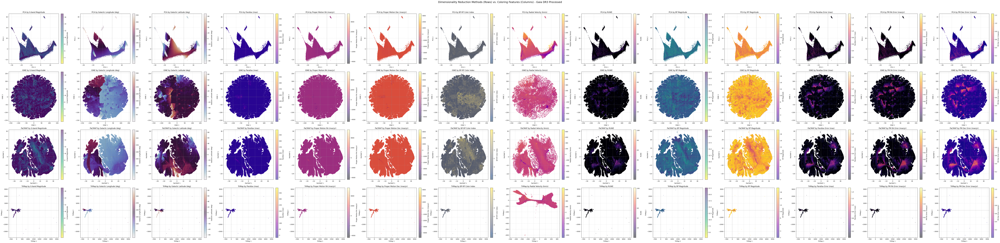

In [7]:
if embeddings and not full_plotting_df.empty:
    n_methods = len(embeddings)
    n_features_to_plot = len(features_to_color_tuples)
    num_points = embeddings[list(embeddings.keys())[0]].shape[0] if embeddings else 0
    marker_size = max(1, 20 / np.log10(max(10, num_points))) if num_points > 0 else 5
    fig, axes = plt.subplots(n_methods, n_features_to_plot, figsize=(7*n_features_to_plot, 6*n_methods), squeeze=False)
    for row_idx, (method_name, emb_data) in enumerate(embeddings.items()):
        for col_idx, (feature_name, feature_label, cmap) in enumerate(features_to_color_tuples):
            ax = axes[row_idx][col_idx]
            if feature_name not in full_plotting_df.columns:
                ax.set_title(f'{method_name} - Missing: {feature_label}')
                ax.text(0.5, 0.5, f'Missing:\n{feature_label}', ha='center', va='center', transform=ax.transAxes)
                continue
            color_values = full_plotting_df[feature_name]
            current_emb_data = emb_data
            current_color_values = color_values
            if len(emb_data) != len(color_values):
                min_len = min(len(emb_data), len(color_values))
                current_emb_data = emb_data[:min_len]
                current_color_values = color_values[:min_len]
                if min_len == 0:
                    ax.set_title(f'{method_name} by {feature_label} (No data)')
                    continue
            if current_color_values.isnull().all():
                scatter = ax.scatter(current_emb_data[:, 0], current_emb_data[:, 1], alpha=0.5, s=marker_size, color='grey')
            else:
                scatter = ax.scatter(current_emb_data[:, 0], current_emb_data[:, 1], c=current_color_values, cmap=cmap, alpha=0.5, s=marker_size)
            ax.set_xlabel(f'{method_name} 1')
            ax.set_ylabel(f'{method_name} 2')
            ax.set_title(f'{method_name} by {feature_label}')
            try:
                cbar = fig.colorbar(scatter, ax=ax, fraction=0.046, pad=0.04)
                cbar.set_label(feature_label)
            except Exception as e:
                print(f"Could not create colorbar for {method_name} by {feature_label}: {e}")
            ax.grid(True, linestyle='--', alpha=0.5)
            ax.axhline(0, color='grey', lw=0.5)
            ax.axvline(0, color='grey', lw=0.5)
    plt.suptitle('Dimensionality Reduction Methods (Rows) vs. Coloring Features (Columns) - Gaia DR3 Processed', fontsize=18, y=0.99)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

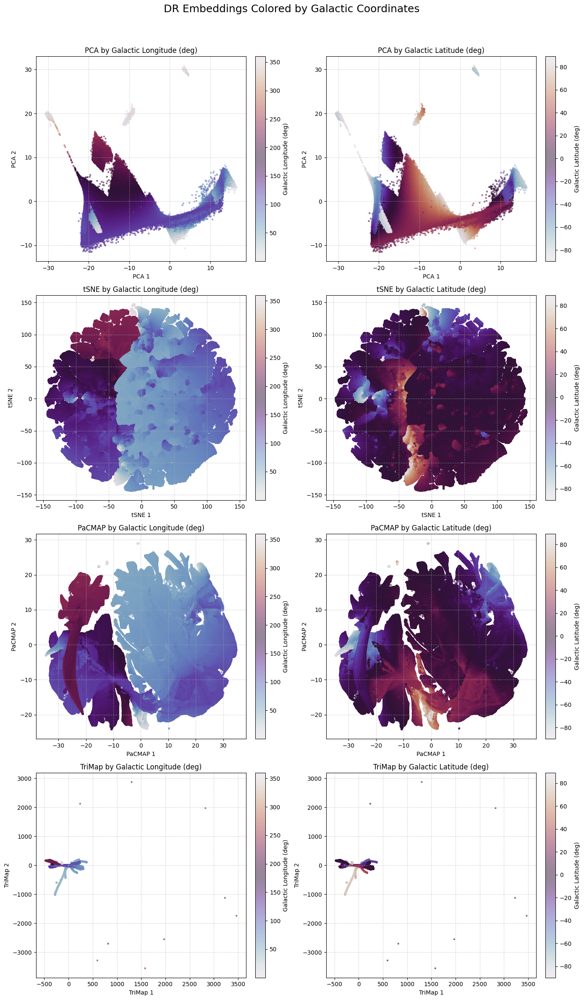

In [ ]:
# Visualize DR embeddings colored by galactic longitude and latitude
if embeddings and not full_plotting_df.empty:
    n_methods = len(embeddings)
    fig, axes = plt.subplots(n_methods, 2, figsize=(14, 6*n_methods), squeeze=False)
    for row_idx, (method_name, emb_data) in enumerate(embeddings.items()):
        for col_idx, (feature, label, cmap) in enumerate([
            ('l', 'Galactic Longitude (deg)', 'twilight'),
            ('b', 'Galactic Latitude (deg)', 'twilight')
        ]):
            ax = axes[row_idx][col_idx]
            color_values = full_plotting_df[feature]
            scatter = ax.scatter(emb_data[:, 0], emb_data[:, 1], c=color_values, cmap=cmap, alpha=0.5, s=5)
            ax.set_xlabel(f'{method_name} 1')
            ax.set_ylabel(f'{method_name} 2')
            ax.set_title(f'{method_name} by {label}')
            cbar = fig.colorbar(scatter, ax=ax, fraction=0.046, pad=0.04)
            cbar.set_label(label)
            ax.grid(True, linestyle='--', alpha=0.5)
    plt.suptitle('DR Embeddings Colored by Galactic Coordinates', fontsize=18, y=0.99)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()